In [1]:
import os
import numpy as np
import cv2
import matplotlib.pyplot as plt
from scipy.ndimage import gaussian_filter
import torch
from torchvision import models, transforms


class Fusion:
    def __init__(self, sharp_path: str, colorful_path: str, output_dir: str = "outputs"):
        self.img_sharp_bgr = cv2.imread(sharp_path)
        self.img_color_bgr = cv2.imread(colorful_path)
        if self.img_sharp_bgr is None or self.img_color_bgr is None:
            raise ValueError("Could not read one or both images")
        if self.img_sharp_bgr.shape != self.img_color_bgr.shape:
            h = min(self.img_sharp_bgr.shape[0], self.img_color_bgr.shape[0])
            w = min(self.img_sharp_bgr.shape[1], self.img_color_bgr.shape[1])
            self.img_sharp_bgr = cv2.resize(self.img_sharp_bgr, (w, h))
            self.img_color_bgr = cv2.resize(self.img_color_bgr, (w, h))

        self.img_sharp_rgb = cv2.cvtColor(self.img_sharp_bgr, cv2.COLOR_BGR2RGB)
        self.img_color_rgb = cv2.cvtColor(self.img_color_bgr, cv2.COLOR_BGR2RGB)

        self.fcn_model = None

        self.output_dir = output_dir
        os.makedirs(self.output_dir, exist_ok=True)

    #frequency seperation fusion
    def freq_stages(self, radius: int = 15):
        sharp = self.img_sharp_rgb.astype(np.float32)
        colorful = self.img_color_rgb.astype(np.float32)

        sharp_low = cv2.GaussianBlur(sharp, (0, 0), sigmaX=radius)
        colorful_low = cv2.GaussianBlur(colorful, (0, 0), sigmaX=radius)
        sharp_high = sharp - sharp_low
        fused = colorful_low + sharp_high
        fused = np.clip(fused, 0, 255).astype(np.uint8)

        return {
            "sharp": self.img_sharp_rgb,
            "colorful": self.img_color_rgb,
            "sharp_low": sharp_low.astype(np.uint8),
            "colorful_low": colorful_low.astype(np.uint8),
            "sharp_high_vis": np.clip(sharp_high + 128., 0, 255).astype(np.uint8),
            "fused_freq": fused,
        }

    def show_freq_stages(self):
        st = self.freq_stages()
        titles_imgs = [
            ("Sharp", st["sharp"]),
            ("Colorful", st["colorful"]),
            ("Sharp low-freq", st["sharp_low"]),
            ("Colorful low-freq", st["colorful_low"]),
            ("Sharp high-freq (vis)", st["sharp_high_vis"]),
            ("Freq fused", st["fused_freq"]),
        ]
        plt.figure(figsize=(12, 8))
        for i, (t, img) in enumerate(titles_imgs, 1):
            plt.subplot(2, 3, i)
            if img.ndim == 2:
                plt.imshow(img, cmap="gray")
            else:
                plt.imshow(img)
            plt.title(t)
            plt.axis("off")
        plt.tight_layout()
        grid_path = os.path.join(self.output_dir, "freq_stages_grid.png")
        plt.savefig(grid_path, dpi=150, bbox_inches="tight")
        plt.show()
        out_path = os.path.join(self.output_dir, "freq_fused.png")
        cv2.imwrite(out_path, cv2.cvtColor(st["fused_freq"], cv2.COLOR_RGB2BGR))

    #multi resolution wavelet fusion
    def wavelet_stages(self):
        sharp = self.img_sharp_rgb.astype(np.float32)
        colorful = self.img_color_rgb.astype(np.float32)
        fused = np.zeros_like(sharp)
        scales = [2, 5, 10, 20]

        bases = []
        details_example = None

        for c in range(3):
            base = gaussian_filter(colorful[:, :, c], sigma=scales[-1])
            bases.append(base)
            prev = sharp[:, :, c]
            channel_details = []
            for sigma in scales:
                blurred = gaussian_filter(sharp[:, :, c], sigma=sigma)
                d = prev - blurred
                channel_details.append(d)
                prev = blurred
            if c == 0:
                details_example = channel_details[0]
            recon = base
            for d in reversed(channel_details):
                recon += d * 1.1
            fused[:, :, c] = recon

        fused = np.clip(fused, 0, 255).astype(np.uint8)
        fused_hsv = cv2.cvtColor(fused, cv2.COLOR_RGB2HSV).astype(np.float32)
        fused_hsv[:, :, 1] = np.clip(fused_hsv[:, :, 1] * 1.1, 0, 255)
        fused_sat = cv2.cvtColor(fused_hsv.astype(np.uint8), cv2.COLOR_HSV2RGB)

        base_stack = np.stack(bases, axis=2).astype(np.uint8)
        detail_vis = np.clip(details_example + 128., 0, 255).astype(np.uint8)

        return {
            "sharp": self.img_sharp_rgb,
            "colorful": self.img_color_rgb,
            "base_rgb_stack": base_stack,
            "detail_example_vis": detail_vis,
            "wavelet_fused_raw": fused,
            "wavelet_fused_sat": fused_sat,
        }

    def show_wavelet_stages(self):
        st = self.wavelet_stages()
        titles_imgs = [
            ("Sharp", st["sharp"]),
            ("Colorful", st["colorful"]),
            ("Base (RGB stack)", st["base_rgb_stack"]),
            ("Detail example (vis)", st["detail_example_vis"]),
            ("Wavelet fused (raw)", st["wavelet_fused_raw"]),
            ("Wavelet fused (sat+)", st["wavelet_fused_sat"]),
        ]
        plt.figure(figsize=(12, 8))
        for i, (t, img) in enumerate(titles_imgs, 1):
            plt.subplot(2, 3, i)
            if img.ndim == 2:
                plt.imshow(img, cmap="gray")
            else:
                plt.imshow(img)
            plt.title(t)
            plt.axis("off")
        plt.tight_layout()
        grid_path = os.path.join(self.output_dir, "wavelet_stages_grid.png")
        plt.savefig(grid_path, dpi=150, bbox_inches="tight")
        plt.show()
        out_path = os.path.join(self.output_dir, "wavelet_fused.png")
        cv2.imwrite(out_path, cv2.cvtColor(st["wavelet_fused_sat"], cv2.COLOR_RGB2BGR))

    #luminance transfer fusion
    def luminance_stages(self):
        sharp_lab = cv2.cvtColor(self.img_sharp_bgr, cv2.COLOR_BGR2LAB).astype(np.float32)
        colorful_lab = cv2.cvtColor(self.img_color_bgr, cv2.COLOR_BGR2LAB).astype(np.float32)

        sharp_L = sharp_lab[:, :, 0]
        color_a = colorful_lab[:, :, 1]
        color_b = colorful_lab[:, :, 2]

        result_lab = colorful_lab.copy()
        result_lab[:, :, 0] = sharp_L
        result = cv2.cvtColor(result_lab.astype(np.uint8), cv2.COLOR_LAB2RGB)

        return {
            "sharp_rgb": self.img_sharp_rgb,
            "colorful_rgb": self.img_color_rgb,
            "sharp_L": sharp_L.astype(np.uint8),
            "color_a": color_a.astype(np.uint8),
            "color_b": color_b.astype(np.uint8),
            "luminance_fused": result,
        }

    def show_luminance_stages(self):
        st = self.luminance_stages()
        titles_imgs = [
            ("Sharp RGB", st["sharp_rgb"]),
            ("Colorful RGB", st["colorful_rgb"]),
            ("Sharp L", st["sharp_L"]),
            ("Color a", st["color_a"]),
            ("Color b", st["color_b"]),
            ("Luminance fused", st["luminance_fused"]),
        ]
        plt.figure(figsize=(12, 8))
        for i, (t, img) in enumerate(titles_imgs, 1):
            plt.subplot(2, 3, i)
            if img.ndim == 2:
                plt.imshow(img, cmap="gray")
            else:
                plt.imshow(img)
            plt.title(t)
            plt.axis("off")
        plt.tight_layout()
        grid_path = os.path.join(self.output_dir, "luminance_stages_grid.png")
        plt.savefig(grid_path, dpi=150, bbox_inches="tight")
        plt.show()
        out_path = os.path.join(self.output_dir, "luminance_fused.png")
        cv2.imwrite(out_path, cv2.cvtColor(st["luminance_fused"], cv2.COLOR_RGB2BGR))

    #FCN + Poisson + Guided Fusion
    def _load_fcn(self):
        if self.fcn_model is None:
            try:
                self.fcn_model = models.segmentation.deeplabv3_resnet101(
                    weights=models.segmentation.DeepLabV3_ResNet101_Weights.DEFAULT
                )
            except AttributeError:
                self.fcn_model = models.segmentation.deeplabv3_resnet101(pretrained=True)
            self.fcn_model.eval()
        return self.fcn_model

    def fcn_poisson_guided_stages(self):
        model = self._load_fcn()
        transform = transforms.Compose([
            transforms.ToPILImage(),
            transforms.Resize((520, 520)),
            transforms.ToTensor(),
            transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                 std=[0.229, 0.224, 0.225])
        ])
        inp = transform(self.img_sharp_rgb).unsqueeze(0)
        with torch.no_grad():
            out = model(inp)
        out_np = out["out"][0].detach().cpu().numpy()
        seg_small = np.argmax(out_np, axis=0).astype(np.uint8)
        seg = cv2.resize(seg_small, (self.img_sharp_rgb.shape[1],
                                     self.img_sharp_rgb.shape[0]),
                         interpolation=cv2.INTER_NEAREST)

        num_labels = int(seg.max()) + 1
        cmap = np.random.randint(0, 255, size=(num_labels, 3), dtype=np.uint8)
        color_seg = np.zeros_like(self.img_sharp_rgb)
        for l in range(num_labels):
            color_seg[seg == l] = cmap[l]

        fg = (seg != 0).astype(np.float32)
        fg_blur = cv2.GaussianBlur(fg, (0, 0), sigmaX=5)
        fg_blur /= (fg_blur.max() + 1e-8)
        soft_mask = fg_blur[..., None]

        src_bgr = self.img_sharp_bgr
        dst_bgr = self.img_color_bgr.copy()
        h, w = dst_bgr.shape[:2]
        full_mask = 255 * np.ones((h, w), dtype=np.uint8)
        center = (w // 2, h // 2)

        poisson_bgr = cv2.seamlessClone(
            src_bgr, dst_bgr, full_mask, center, cv2.MIXED_CLONE
        )
        poisson_rgb = cv2.cvtColor(poisson_bgr, cv2.COLOR_BGR2RGB)

        sharp = self.img_sharp_rgb.astype(np.float32) / 255.0
        poisson = poisson_rgb.astype(np.float32) / 255.0

        base_sharp = cv2.GaussianBlur(sharp, (0, 0), sigmaX=8)
        details_sharp = sharp - base_sharp

        gray_sharp = cv2.cvtColor((sharp * 255).astype(np.uint8), cv2.COLOR_RGB2GRAY)
        edges = cv2.Canny(gray_sharp, 50, 150).astype(np.float32) / 255.0
        edge_weight = cv2.GaussianBlur(edges, (0, 0), sigmaX=3)[..., None]

        combined_weight = edge_weight * soft_mask
        alpha = 0.8
        guided_details = details_sharp * (alpha * combined_weight)
        fused = poisson + guided_details
        fused = np.clip(fused, 0, 1)
        fused_u8 = (fused * 255).astype(np.uint8)

        return {
            "sharp": self.img_sharp_rgb,
            "colorful": self.img_color_rgb,
            "fcn_seg_color": color_seg,
            "fcn_soft_mask": soft_mask[..., 0],
            "poisson_rgb": poisson_rgb,
            "details_sharp_vis": np.clip(details_sharp * 255 + 128., 0, 255).astype(np.uint8),
            "edge_weight": edge_weight[..., 0],
            "combined_weight": combined_weight[..., 0],
            "fcn_poisson_guided": fused_u8,
        }

    def show_fcn_poisson_guided_stages(self):
        st = self.fcn_poisson_guided_stages()
        titles_imgs = [
            ("Sharp", st["sharp"]),
            ("Colorful", st["colorful"]),
            ("FCN segmentation", st["fcn_seg_color"]),
            ("FCN soft mask", st["fcn_soft_mask"]),
            ("Poisson result", st["poisson_rgb"]),
            ("Details sharp (vis)", st["details_sharp_vis"]),
            ("Edge weight", st["edge_weight"]),
            ("Combined weight", st["combined_weight"]),
            ("FCN+Poisson+Guided", st["fcn_poisson_guided"]),
        ]
        plt.figure(figsize=(14, 10))
        for i, (t, img) in enumerate(titles_imgs, 1):
            plt.subplot(3, 3, i)
            if img.ndim == 2:
                plt.imshow(img, cmap="gray")
            else:
                plt.imshow(img)
            plt.title(t)
            plt.axis("off")
        plt.tight_layout()
        grid_path = os.path.join(self.output_dir, "fcn_poisson_guided_stages_grid.png")
        plt.savefig(grid_path, dpi=150, bbox_inches="tight")
        plt.show()
        out_path = os.path.join(self.output_dir, "fcn_poisson_guided.png")
        cv2.imwrite(out_path, cv2.cvtColor(st["fcn_poisson_guided"], cv2.COLOR_RGB2BGR))

    #GraphCut + Poisson + Guided Fusion
    def graphcut_poisson_guided_stages(self, rect=None, iters: int = 5):
        img = self.img_sharp_bgr.copy()
        h, w = img.shape[:2]
        if rect is None:
            x0 = int(w * 0.1); y0 = int(h * 0.1)
            x1 = int(w * 0.9); y1 = int(h * 0.9)
            rect = (x0, y0, x1 - x0, y1 - y0)

        mask = np.zeros((h, w), np.uint8)
        bgdModel = np.zeros((1, 65), np.float64)
        fgdModel = np.zeros((1, 65), np.float64)
        cv2.grabCut(img, mask, rect, bgdModel, fgdModel, iters, cv2.GC_INIT_WITH_RECT)

        hard_fg = np.where((mask == cv2.GC_FGD) | (mask == cv2.GC_PR_FGD), 1.0, 0.0).astype(np.float32)
        soft_fg = cv2.GaussianBlur(hard_fg, (0, 0), sigmaX=5)
        soft_fg /= (soft_fg.max() + 1e-8)
        soft_mask = soft_fg[..., None]

        src_bgr = self.img_sharp_bgr
        dst_bgr = self.img_color_bgr.copy()
        full_mask = 255 * np.ones((h, w), dtype=np.uint8)
        center = (w // 2, h // 2)
        poisson_bgr = cv2.seamlessClone(
            src_bgr, dst_bgr, full_mask, center, cv2.MIXED_CLONE
        )
        poisson_rgb = cv2.cvtColor(poisson_bgr, cv2.COLOR_BGR2RGB)

        sharp = self.img_sharp_rgb.astype(np.float32) / 255.0
        poisson = poisson_rgb.astype(np.float32) / 255.0

        base_sharp = cv2.GaussianBlur(sharp, (0, 0), sigmaX=8)
        details_sharp = sharp - base_sharp
        gray_sharp = cv2.cvtColor((sharp * 255).astype(np.uint8), cv2.COLOR_RGB2GRAY)
        edges = cv2.Canny(gray_sharp, 50, 150).astype(np.float32) / 255.0
        edge_weight = cv2.GaussianBlur(edges, (0, 0), sigmaX=3)[..., None]

        combined_weight = edge_weight * soft_mask
        alpha = 0.8
        guided_details = details_sharp * (alpha * combined_weight)
        fused = poisson + guided_details
        fused = np.clip(fused, 0, 1)
        fused_u8 = (fused * 255).astype(np.uint8)

        rect_vis = img.copy()
        x, y, w_r, h_r = rect
        cv2.rectangle(rect_vis, (x, y), (x + w_r, y + h_r), (0, 0, 255), 2)

        grabcut_fg_vis = (hard_fg * 255).astype(np.uint8)

        return {
            "sharp": self.img_sharp_rgb,
            "colorful": self.img_color_rgb,
            "init_rect_vis": cv2.cvtColor(rect_vis, cv2.COLOR_BGR2RGB),
            "grabcut_hard_fg": grabcut_fg_vis,
            "grabcut_soft_mask": soft_mask[..., 0],
            "poisson_rgb": poisson_rgb,
            "details_sharp_vis": np.clip(details_sharp * 255 + 128., 0, 255).astype(np.uint8),
            "edge_weight": edge_weight[..., 0],
            "combined_weight": combined_weight[..., 0],
            "gc_poisson_guided": fused_u8,
        }

    def show_graphcut_poisson_guided_stages(self, rect=None, iters: int = 5):
        st = self.graphcut_poisson_guided_stages(rect=rect, iters=iters)
        titles_imgs = [
            ("Sharp", st["sharp"]),
            ("Colorful", st["colorful"]),
            ("Init rect", st["init_rect_vis"]),
            ("GrabCut hard FG", st["grabcut_hard_fg"]),
            ("GrabCut soft mask", st["grabcut_soft_mask"]),
            ("Poisson result", st["poisson_rgb"]),
            ("Details sharp (vis)", st["details_sharp_vis"]),
            ("Edge weight", st["edge_weight"]),
            ("GC+Poisson+Guided", st["gc_poisson_guided"]),
        ]
        plt.figure(figsize=(14, 10))
        for i, (t, img) in enumerate(titles_imgs, 1):
            plt.subplot(3, 3, i)
            if img.ndim == 2:
                plt.imshow(img, cmap="gray")
            else:
                plt.imshow(img)
            plt.title(t)
            plt.axis("off")
        plt.tight_layout()
        grid_path = os.path.join(self.output_dir, "graphcut_poisson_guided_stages_grid.png")
        plt.savefig(grid_path, dpi=150, bbox_inches="tight")
        plt.show()
        out_path = os.path.join(self.output_dir, "graphcut_poisson_guided.png")
        cv2.imwrite(out_path, cv2.cvtColor(st["gc_poisson_guided"], cv2.COLOR_RGB2BGR))

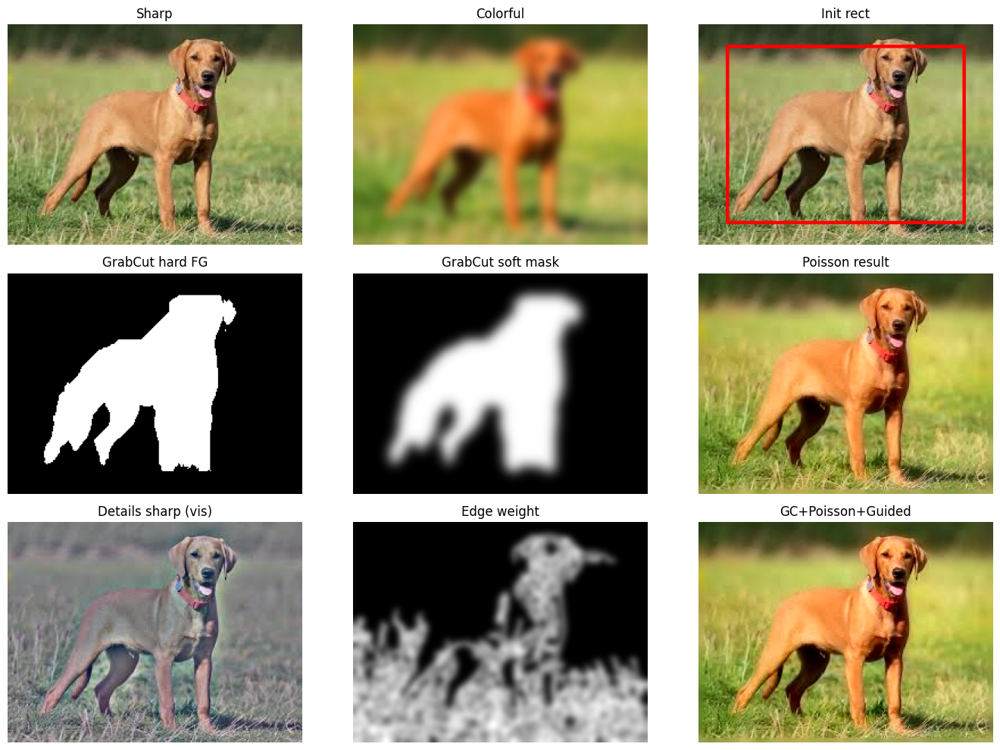

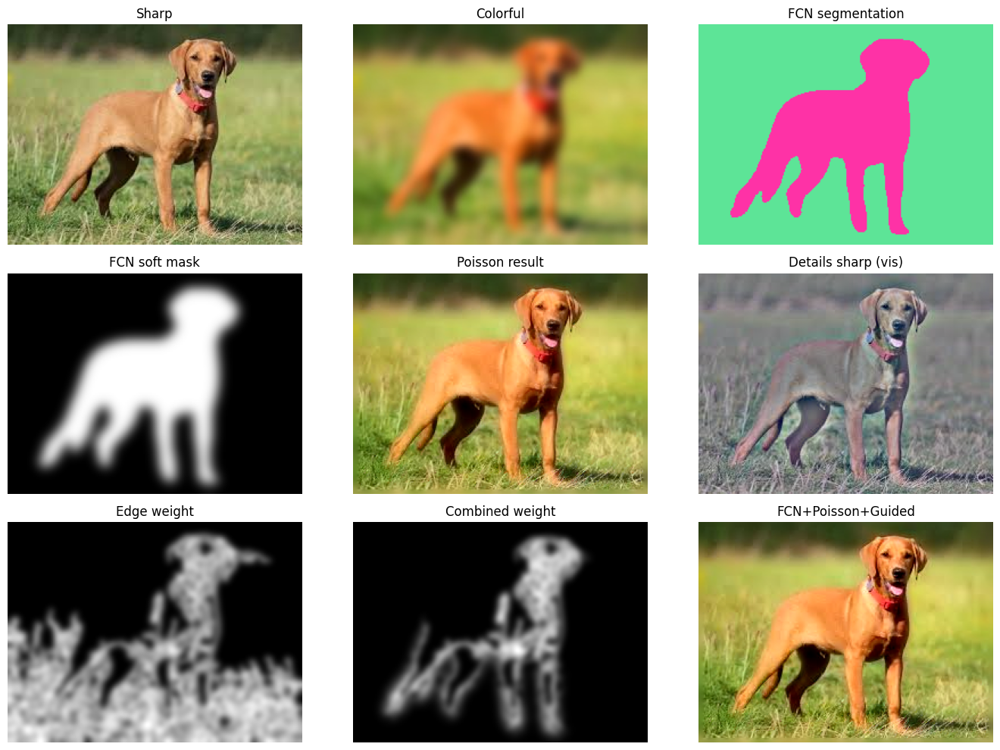

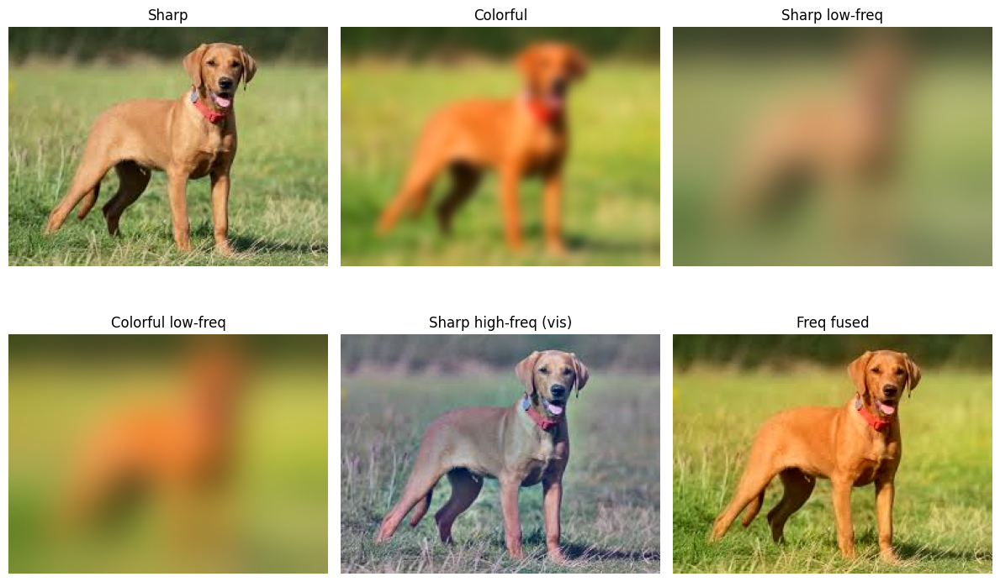

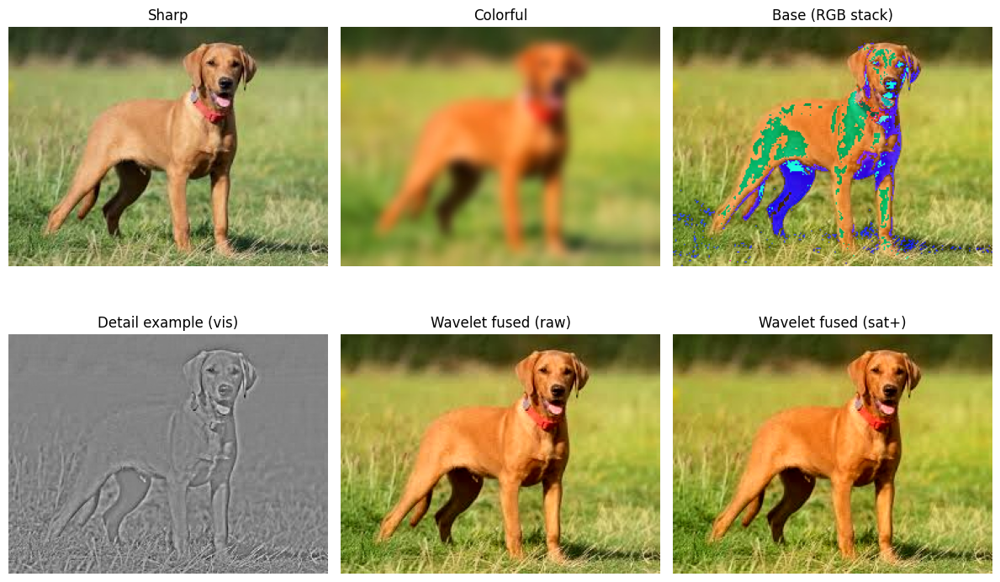

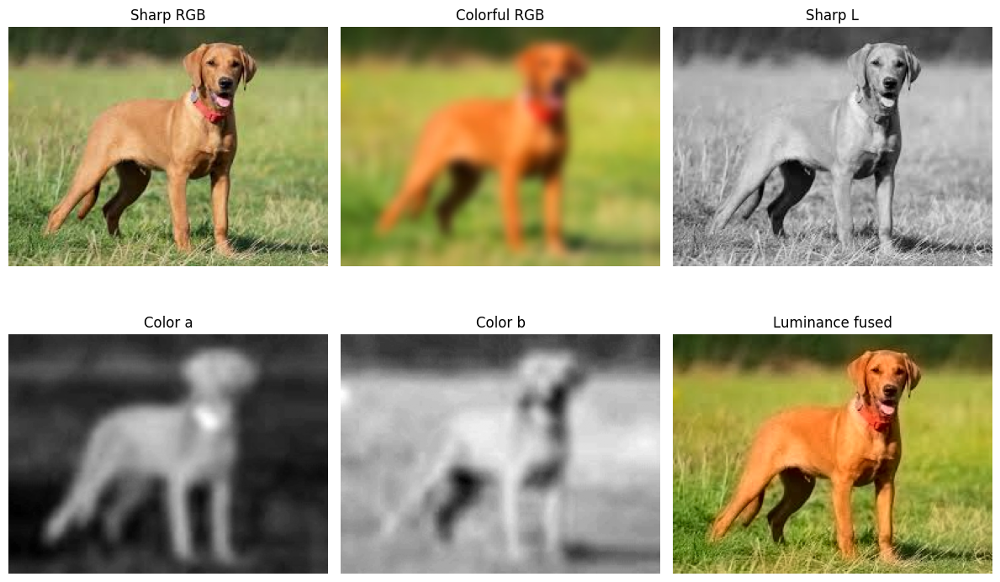

In [2]:
if __name__ == "__main__":
    sharp_img = "dog2.jpeg"
    colorful_img = "dog1.jpeg"

    out_folder = "dog_outputs"

    pipe = Fusion(sharp_img, colorful_img,
                                       output_dir=out_folder)

    pipe.show_graphcut_poisson_guided_stages()
    pipe.show_fcn_poisson_guided_stages()
    pipe.show_freq_stages()
    pipe.show_wavelet_stages()
    pipe.show_luminance_stages()

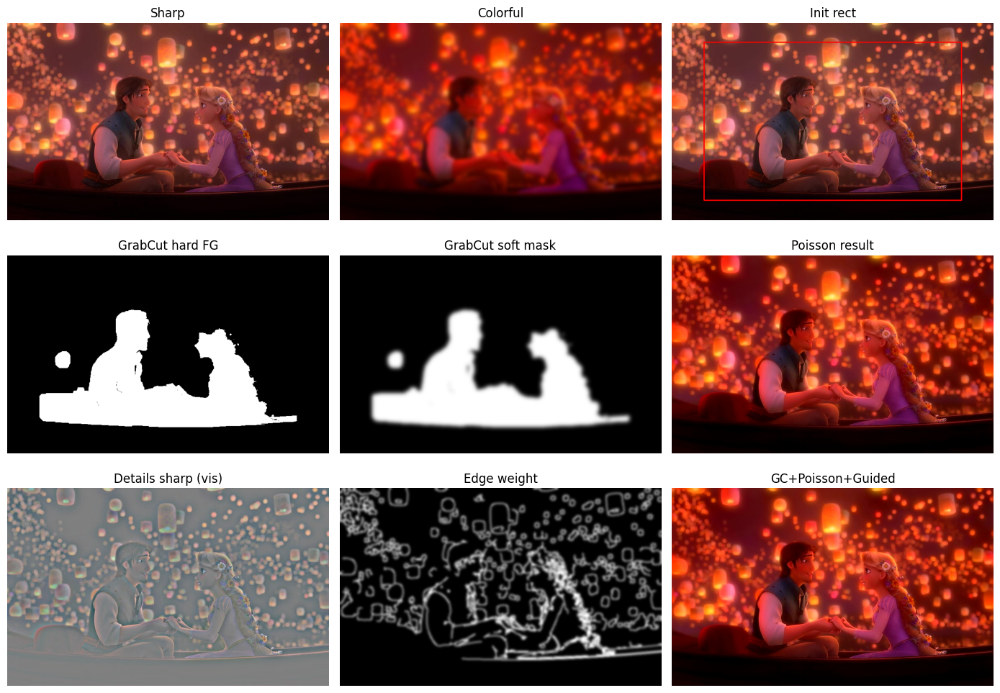

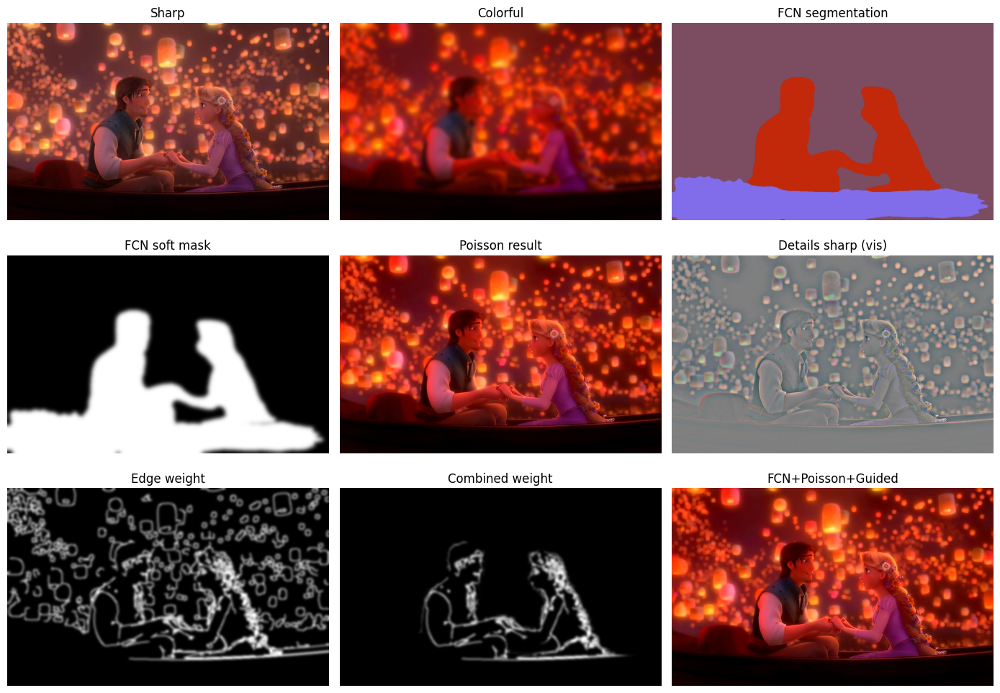

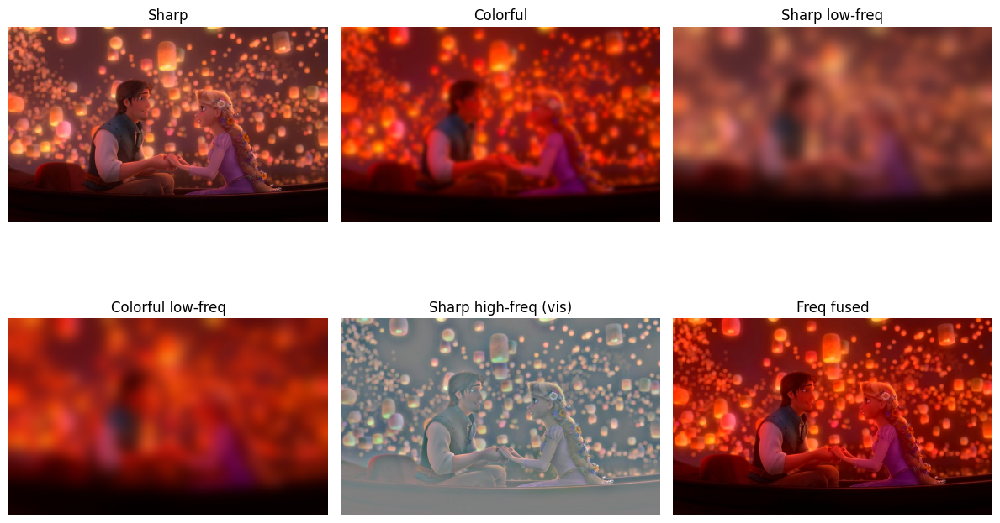

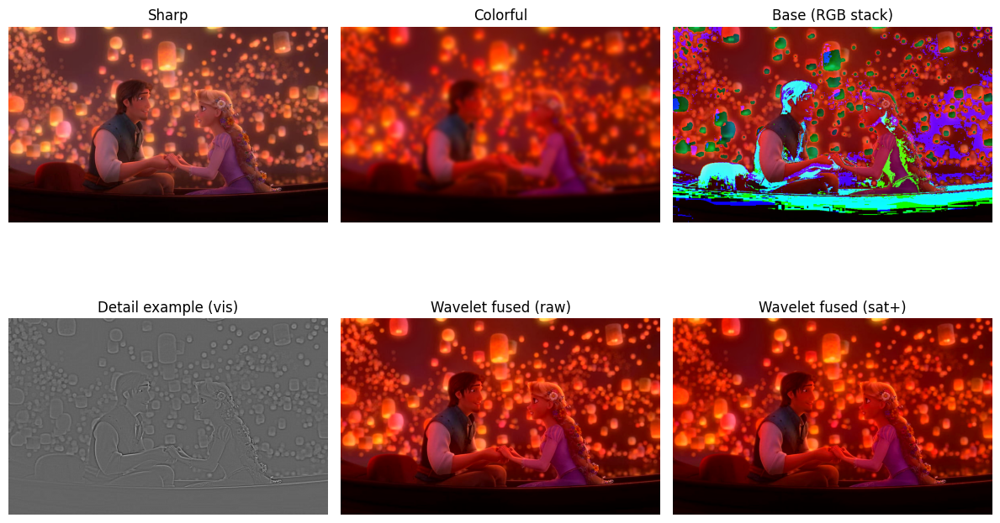

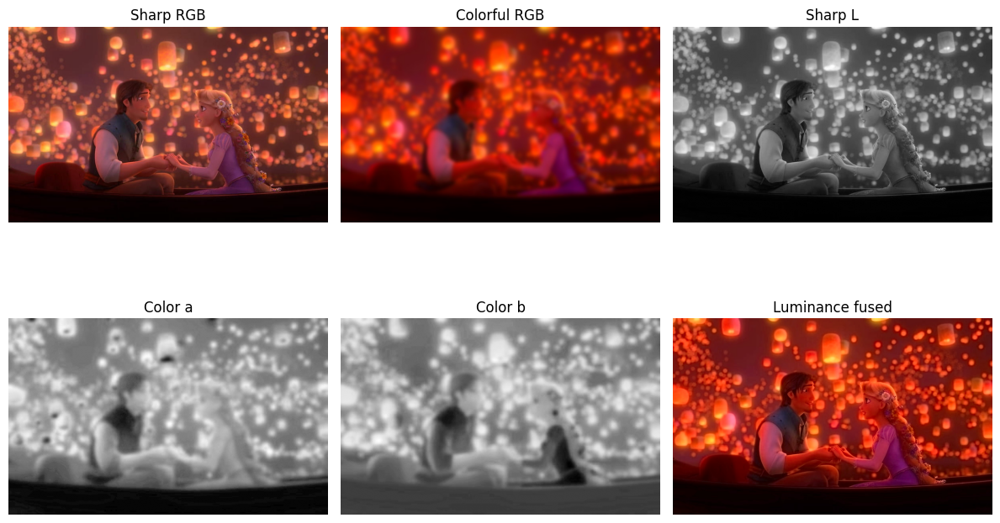

In [3]:
if __name__ == "__main__":
    sharp_img = "tangled2.jpeg"
    colorful_img = "tangled1.jpeg"

    out_folder = "tangled_outputs"

    pipe = Fusion(sharp_img, colorful_img,
                                       output_dir=out_folder)

    pipe.show_graphcut_poisson_guided_stages()
    pipe.show_fcn_poisson_guided_stages()
    pipe.show_freq_stages()
    pipe.show_wavelet_stages()
    pipe.show_luminance_stages()